\includegraphics[keepaspectratio]{Redfin.jpg}

# Predicting Housing Market Trends Using Data Science

### Potential Insights:      
The housing market is influenced by a complex mix of economic conditions, supply and demand, and regional variations. Understanding these trends allows buyers, sellers, and investors to make informed decisions.        

This dataset provides insights into housing market trends across different regions. I chose this dataset because:        
- Housing market data reflects economic patterns, consumer behavior, and financial stability.      
- By analyzing price fluctuations, sales trends, and inventory changes, I aim to identify key indicators that predict market shifts.     
- The dataset includes multiple region types, allowing for comparisons between national trends and city-specific behaviors.     
- By leveraging machine learning techniques, I will analyze leading indicators of price changes and market cycles.       

---
### Project Scope
**Objectives:**      
- Identify key trends and patterns in the housing market.        
- Predict market fluctuations using data-driven insights.       
- Provide actionable insights into real estate trends.       

**Deliverables:**      
- Charts, graphs, statistical reports, predictive models.      
- A final research paper detailing insights and methodologies.      

**Milestones:**      
- Week 1: Data collection and cleaning.
- Weeks 2-3: Exploratory Data Analysis (EDA).
- Weeks 4-6: Model selection and training.
- Weeks 7-8: Model validation and optimization.
- Weeks 9-10: Final report and presentation.

**Tasks:**       
- Data acquisition and preprocessing      
- Exploratory data analysis (EDA)      
- Feature engineering and selection      
- Model training and validation      
- Performance evaluation and optimization     
- Presentation of findings      

**Resources:** Python, Pandas, NumPy, Scikit-Learn, Matplotlib, Seaborn, Jupyter Notebook      

---
### Research Plan
**Techniques and Methods:**      
- Time-series analysis to identify long-term trends.
- Regression models to analyze price determinants.
- Machine learning techniques to predict price changes.
- Cross-validation methods to ensure robust model performance.

**Hypothesis & Research Questions**
- **Hypothesis Statement:**        
*Housing market trends can be predicted by analyzing historical price fluctuations, inventory changes, and sales patterns. By applying machine learning techniques, we can identify early indicators of market shifts, allowing for better-informed real estate investment decisions.*

**Research Questions**      
	1.	What factors most influence median sale prices?       
	2.	How do changes in inventory levels affect future prices?      
	3.	Are seasonal trends significant in price fluctuations?       
	4.	Can we predict price changes using historical data?          

# Imports

In [1]:
# my imports
import wrangle as w
import explore as e
#import modeling as m

# ignore warnings
import warnings
warnings.filterwarnings("ignore")

imports loaded successfully, awaiting commands...


# Wrangle
---
- Raw Data acquired from Redfin
- 1099 rows x 20 columns before cleaning
- Data acquired from Google BigQuery after cleaning
- 1099 rows x 20 columns after cleaning

## Prepare
---
- Clean the data
    - Rename columns
    - Remove nulls
    - Remove extra characters
    - Remove extra spaces
    - Fixed data type

In [2]:
redfin_df = w.check_file_exists_gbq("data.csv", "service-account-key.json", 
                                    "iu-thesis-project.Redfin_Monthly_Housing_Market_Data.Redfin")

✅ CSV file 'data.csv' found locally. Checking data quality...
Detected encoding: ascii
✅ Data appears to be clean.
✅ Data is already clean. No need to clean or upload.


### A Brief Look At The Data
---

In [3]:
redfin_df.head()

,region,month_of_period_end,median_sale_price,median_sale_price_mom,median_sale_price_yoy,homes_sold,homes_sold_mom,homes_sold_yoy,new_listings,new_listings_mom,new_listings_yoy,inventory,inventory_mom,inventory_yoy,days_on_market,days_on_market_mom,days_on_market_yoy,average_sale_to_list,average_sale_to_list_mom,average_sale_to_list_yoy
0,National,2022-07-01 00:00:00+00:00,413000,-3.6,7.4,530476,-14.4,-21.9,705215,-14.3,-11.9,1240506,10.2,27.1,21,3,6,101.0,-1.2,-1.2
1,National,2022-08-01 00:00:00+00:00,407000,-1.5,6.9,559150,5.4,-16.9,622537,-11.7,-13.7,1225537,-1.2,26.7,27,5,10,99.9,-1.1,-1.7
2,National,2022-06-01 00:00:00+00:00,429000,-0.7,10.8,619857,4.1,-15.0,822855,6.4,1.0,1125321,20.7,28.1,18,1,3,102.2,-0.8,-0.3
3,National,2021-08-01 00:00:00+00:00,381000,-1.1,16.2,672612,-1.0,0.1,721768,-9.8,0.0,967307,-0.9,-18.2,17,2,-15,101.6,-0.6,2.4
4,National,2021-09-01 00:00:00+00:00,377000,-1.0,13.9,638337,-5.1,-4.7,675008,-6.5,-4.5,969546,0.2,-16.1,19,2,-11,101.0,-0.6,1.7


### A Summary Of The Data
---

In [4]:
e.data_summary(redfin_df)

Data shape: (1099, 20)


,data type,#missing,%missing,#unique,count,mean,std,min,25%,50%,75%,max
region,object,0,0.0,7,1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month_of_period_end,"datetime64[ns, UTC]",0,0.0,157,1099,2018-07-01 19:52:21.401273856+00:00,NaN,2012-01-01 00:00:00+00:00,2015-04-01 00:00:00+00:00,2018-07-01 00:00:00+00:00,2021-10-01 00:00:00+00:00,2025-01-01 00:00:00+00:00
median_sale_price,int64,0,0.0,416,1099.0,407515.013649,189404.64317,134000.0,256500.0,371000.0,525000.0,925000.0
median_sale_price_mom,float64,0,0.0,186,1099.0,0.610464,3.657105,-12.8,-1.8,0.2,2.8,16.4
median_sale_price_yoy,float64,0,0.0,251,1099.0,6.849045,5.72749,-10.7,3.35,6.5,9.7,31.8
homes_sold,int64,0,0.0,1036,1099.0,73960.789809,174049.251215,974.0,3283.0,5108.0,7373.0,729414.0
homes_sold_mom,float64,0,0.0,556,1099.0,1.37152,18.047561,-40.6,-10.7,0.2,11.55,63.4
homes_sold_yoy,float64,0,0.0,490,1099.0,1.94222,17.349035,-56.9,-6.5,1.8,10.7,127.6
new_listings,int64,0,0.0,1062,1099.0,89187.496815,210707.155307,1010.0,3613.0,6070.0,9152.0,844234.0
new_listings_mom,float64,0,0.0,634,1099.0,3.776797,29.206833,-59.5,-13.0,-2.5,14.05,150.3


In [5]:
redfin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1099 entries, 0 to 1098
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   region                    1099 non-null   object             
 1   month_of_period_end       1099 non-null   datetime64[ns, UTC]
 2   median_sale_price         1099 non-null   int64              
 3   median_sale_price_mom     1099 non-null   float64            
 4   median_sale_price_yoy     1099 non-null   float64            
 5   homes_sold                1099 non-null   int64              
 6   homes_sold_mom            1099 non-null   float64            
 7   homes_sold_yoy            1099 non-null   float64            
 8   new_listings              1099 non-null   int64              
 9   new_listings_mom          1099 non-null   float64            
 10  new_listings_yoy          1099 non-null   float64            
 11  inventory        

---
# Exploratory Data Analysis (EDA)

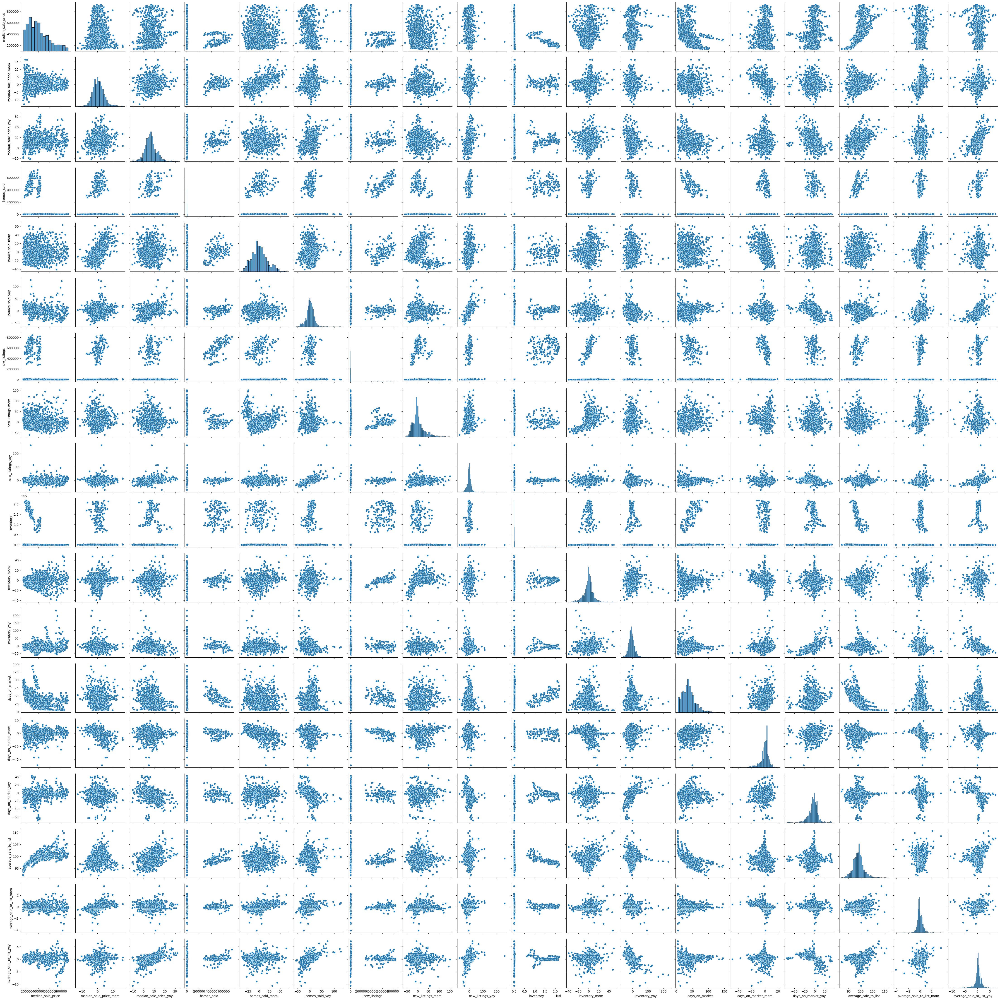

In [6]:
# visualized your data
import matplotlib.pyplot as plt
import seaborn as sns

# to view a bit closer the pairplot double click on the plot
sns.pairplot(redfin_df)

---
#### What is the distribution of the Target?

- Note: this question is more of a look at the data, not a stats test question.

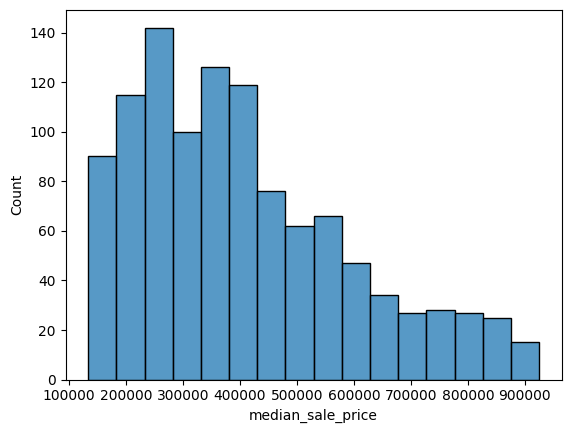

In [42]:
# get a histplot of quality
sns.histplot(redfin_df.median_sale_price)
plt.show()

#### Target Justification: **median_sale_price**

1. Core Predictive Goal
    - Both the Project Proposal (focused on housing market trend prediction) and Literature Review (highlighting house-price forecasting as critical) point to home prices as the principal outcome of interest.
    - As emphasized in Assignment 2, “Accurately predicting real estate house prices is critical for financial institutions, investors, and policymakers.”
2. Data Alignment
    - The Redfin dataset explicitly provides median_sale_price (along with month-over-month and year-over-year variations).
    - In real estate forecasting literature, the median sale price is a standard measure, serving as a robust, central indicator of market conditions.
3. Common Industry Metric
    - Forecasting median sale price is standard practice in both industry and academic settings. It allows analysis of market health and trend over time, region by region.

<div class="alert alert-block alert-info">
<b>Histogram Insights</b>
    
Looking at the histogram of median_sale_price:
- The distribution peaks roughly in the \\$200,000 - \\$300,000 range, indicating that many observations cluster around these mid-range house prices.
- The tail extends toward higher price points (up to $900,000), reflecting that while most houses fall in the lower-to-mid range, there are notable but fewer properties in higher price brackets.
- The shape suggests a right-skew (common in housing data), where a larger number of transactions occur at relatively moderate price levels, and fewer yet higher-priced properties cause the tail to stretch to the right.
</div>
---

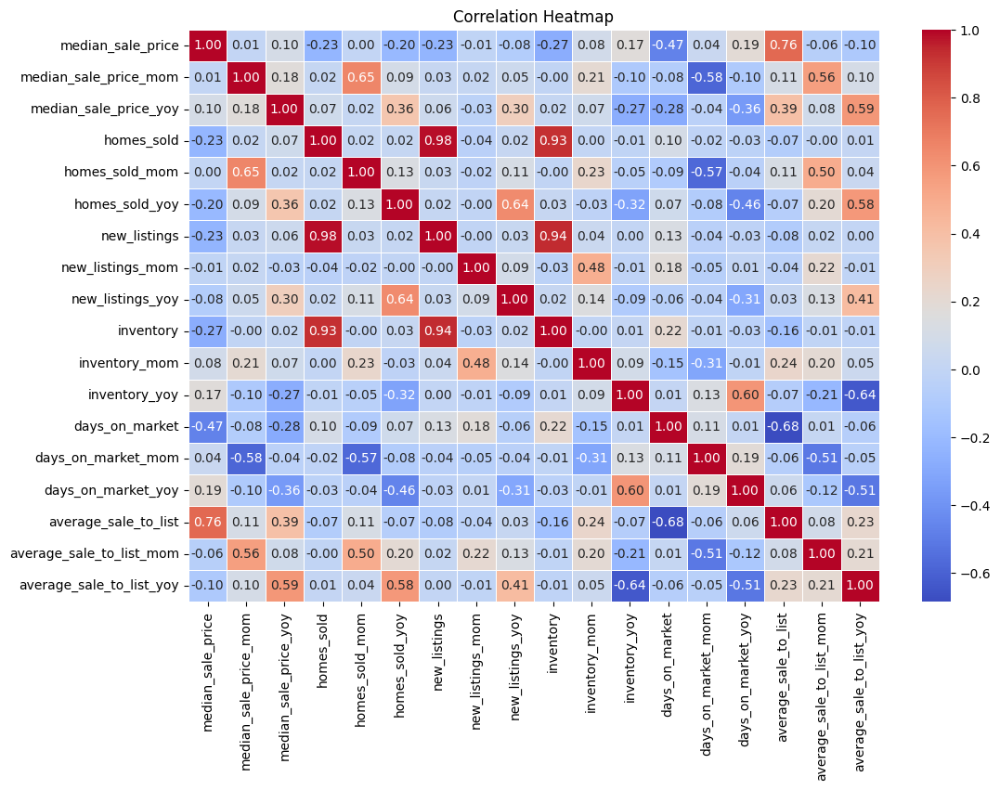

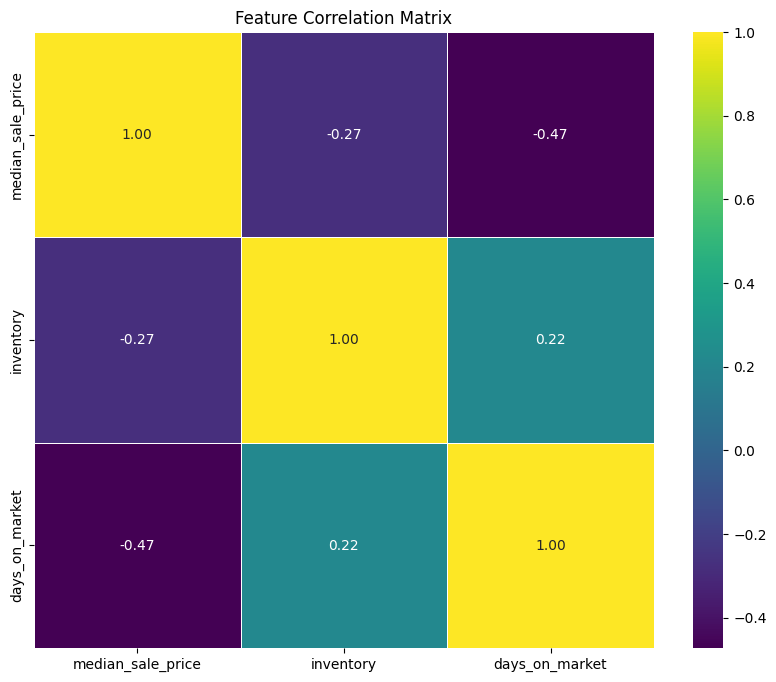

In [8]:
# Correlation heatmap for all columns
e.plot_correlation_heatmap(redfin_df)

cols_of_interest = ['median_sale_price', 'inventory', 'days_on_market']

# Select only numeric columns from the subset
redfin_df_subset = redfin_df[cols_of_interest].select_dtypes(include=['number'])

# Now call the function
e.plot_feature_correlation_heatmap(redfin_df_subset, figsize=(10, 8), cmap='viridis')

<div class="alert alert-block alert-info">
<b>Correlation Matrix (heatmap) Insights</b>
    
**Notable Correlation Patterns**
1. **Negative** Correlation: median_sale_price vs. days_on_market
    - Around -0.47 for the current-month relationship
    - Suggests that when prices are higher, properties tend to sell faster (fewer days on market). Conversely, in slower markets with longer days on market, median prices are typically lower.
2. **Positive** Correlation Between “_yoy” Columns
    - You may see strong positive correlations among “year-over-year” metrics—e.g., new_listings_yoy vs. inventory_yoy.
    - Indicates that increases in new listings over last year often coincide with increases in inventory relative to last year.
3. Moderate/Strong Relationship: median_sale_price and average_sale_to_list
    - Look for a reddish block in the row/column intersection of median_sale_price and average_sale_to_list (and possibly their _yoy versions).
    - A higher sale-to-list ratio can coincide with a stronger market, often reflected in higher median prices.
4. Month-over-Month (MoM) Correlations
    - Some MoM columns (like homes_sold_mom or median_sale_price_mom) may show moderate correlations with each other.
    - This could imply, for example, that monthly surges in sales might accompany monthly rises in price—or vice versa.
5. Days on Market and Homes Sold
    - Often, a negative correlation emerges between days_on_market and homes_sold or homes_sold_mom: markets with more successful sales typically see homes spending fewer days on the market.
        
**Interpreting High Correlation Values**
- Close to +1: Two features move in the same direction nearly every time (e.g., new_listings vs. inventory might be highly correlated if more listings generally lead to more inventory).      
- Close to -1: A strong inverse relationship (e.g., higher median_sale_price typically corresponds to fewer days_on_market).       
- Close to 0: Little direct linear relationship. There may be other complex or nonlinear relationships, or it may just indicate no meaningful interaction.      
    
**Caveats & Next Steps**
- Correlation ≠ Causation: Even if median_sale_price is strongly correlated with inventory, it doesn’t confirm a direct cause-effect. External factors like interest rates or broader economic conditions could drive both.      
- Outliers & Nonlinearities: Some correlations may appear weaker or stronger if there are a few extreme outliers or nonlinear relationships. Pair plots, scatterplots, or transformations (e.g., log scales) can help clarify.      
- Modeling Implications: Strongly correlated variables may lead to multicollinearity in linear models, so we will consider advanced feature selection or regularization (e.g., Ridge/Lasso) if that’s an issue.     
</div>
---

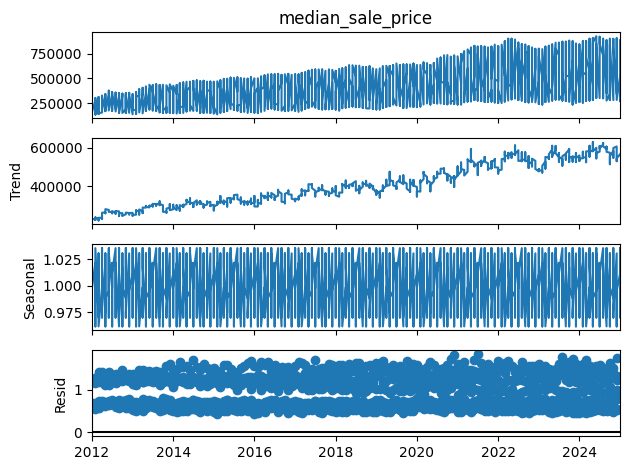

In [9]:
e.plot_seasonal_decomposition(redfin_df, date_col='month_of_period_end', target_col='median_sale_price', model='multiplicative', period=12)

<div class="alert alert-block alert-info">
<b>Seasonal Decomposition Insights</b>

1. Observed
    - The top series shows a long-term increase in median sale prices from around 2012 to 2024.
    - Notice the monthly fluctuations—some months are higher or lower than the smoothed trend, consistent with typical real estate seasonality.
2. Trend
    - The middle-top subplot reveals a steady upward slope from roughly \\$200k to \\$500k+ over the last decade, reflecting long-term market growth.
    - After 2022–2023, the trend appears to plateau or slow, suggesting potential cooling or stabilization in prices.
3. Seasonal
    - Because the model is multiplicative, the seasonal factor hovers around 1.0—meaning monthly prices are typically within a few percentage points above or below the overall trend.
    - The real estate market often shows seasonal peaks (e.g., spring/summer) and troughs (winter). In a multiplicative model, these bumps are a percentage of the underlying trend, rather than a fixed amount.
4. Residual
    - The bottom subplot shows what’s left after removing the trend and seasonal components.
    - If the residual looks mostly random, that indicates the trend+seasonality capture the main structure of the series. Occasional spikes or dips might point to external shocks (e.g., policy changes or unexpected events).
</div>
---

In [10]:
# Identifying numerical and categorical columns
numerical_cols = redfin_df.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = redfin_df.select_dtypes(include=['object', 'bool']).columns

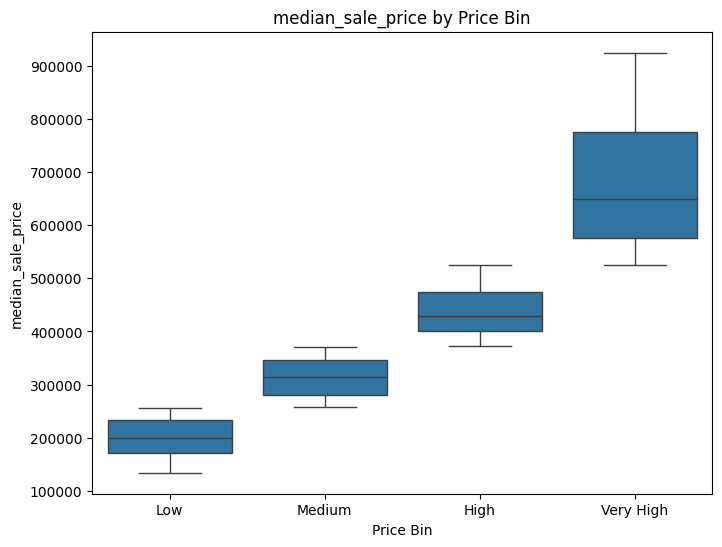

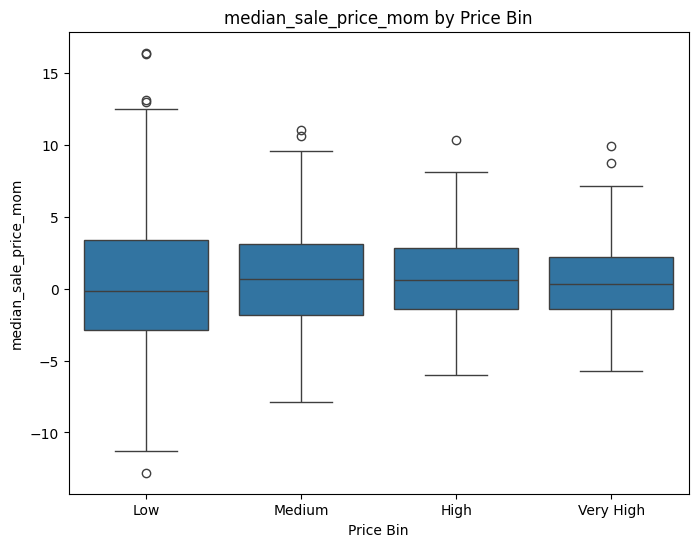

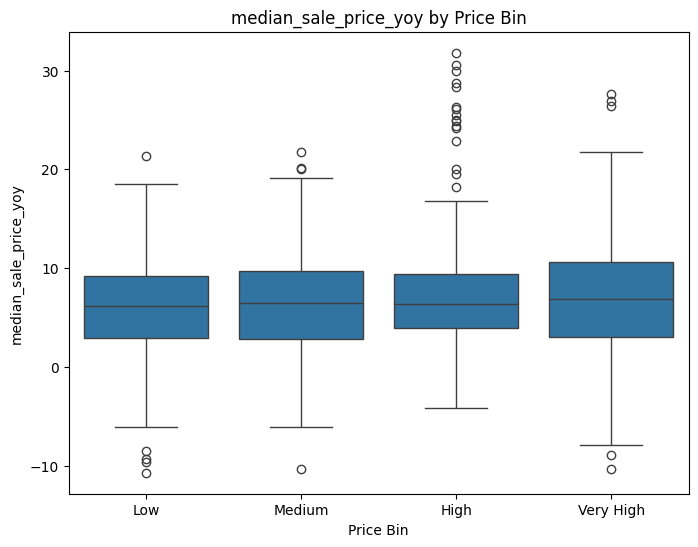

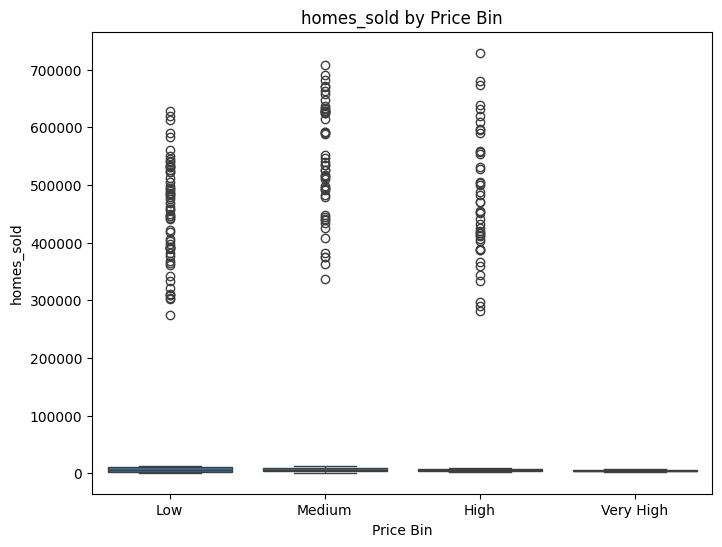

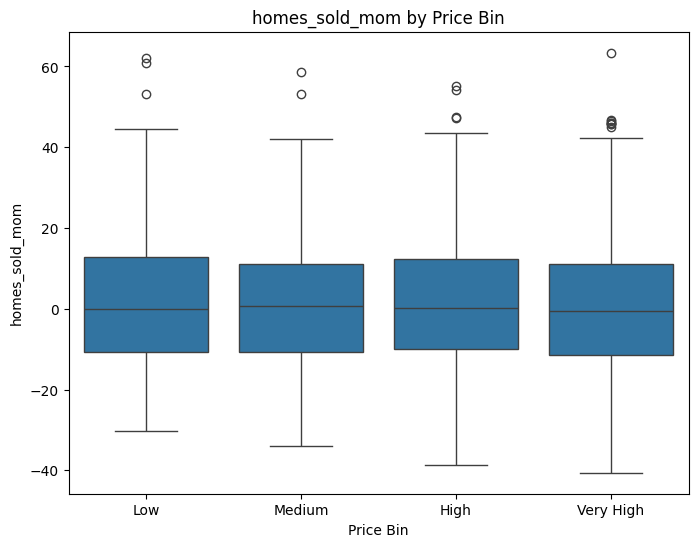

...

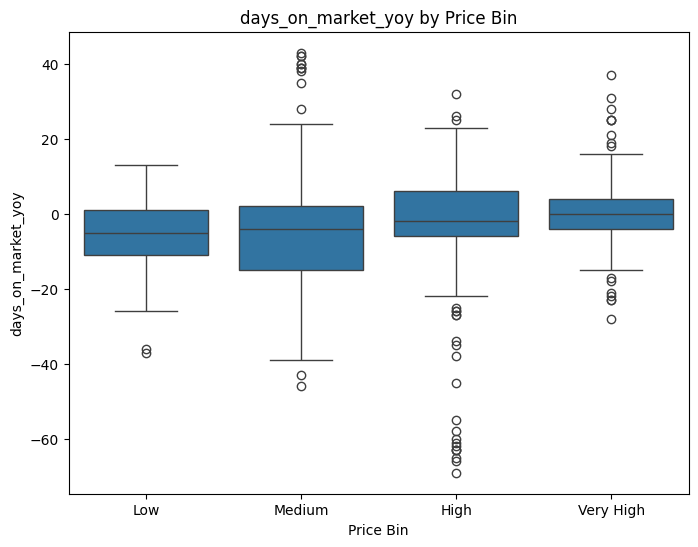

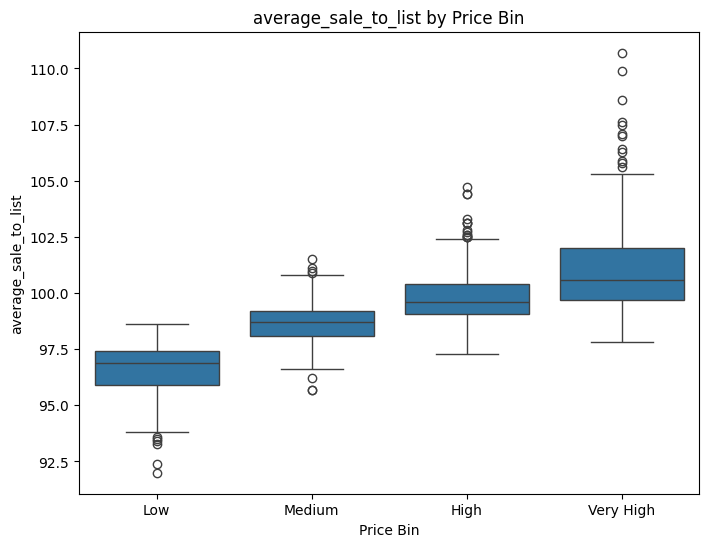

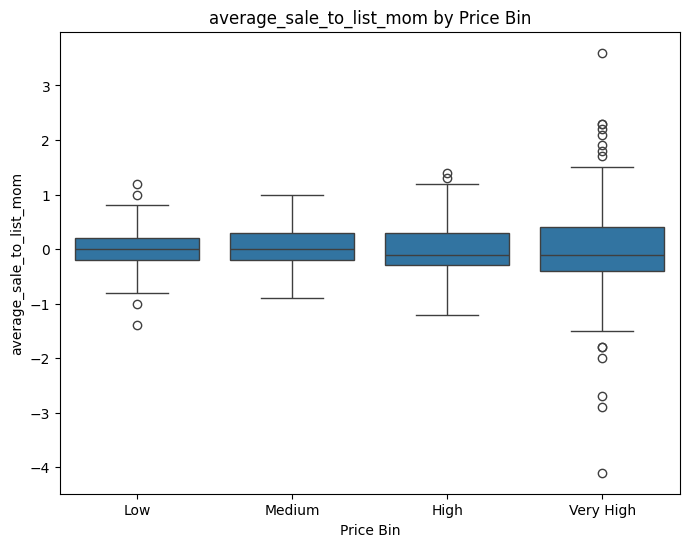

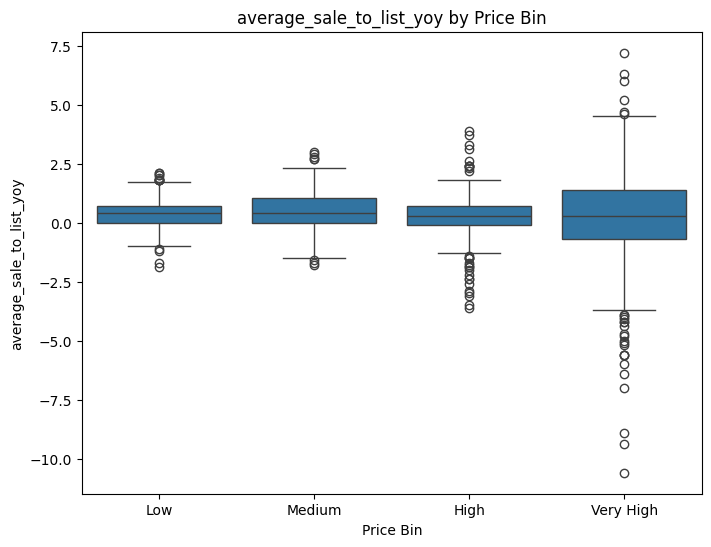

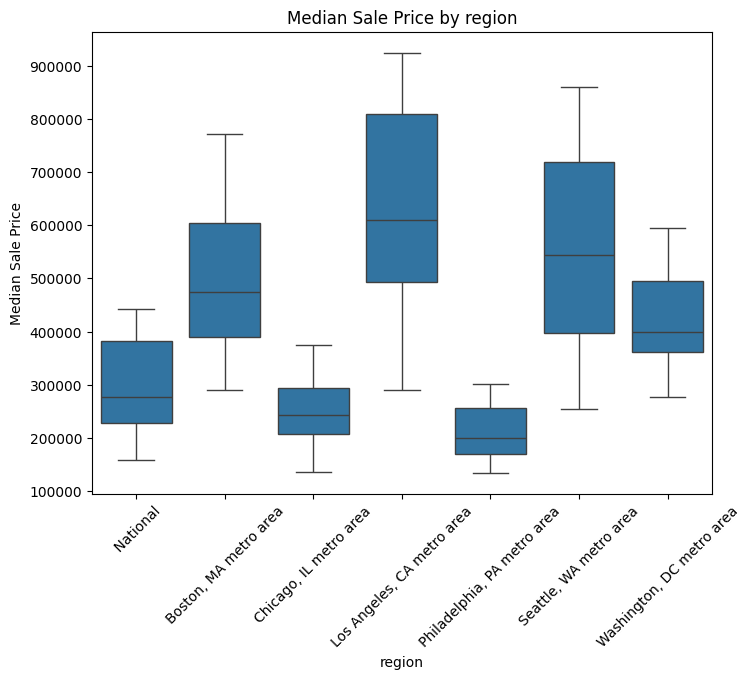

In [11]:
e.bivariate_boxplot(redfin_df, numerical_cols, categorical_cols)

<div class="alert alert-block alert-info">
<b>BoxPlot Insights</b>

Below is an explanation of the key boxplots I’ve produced and why they matter for my project. Rather than listing every single variable, I'm focusing on those with notable outliers or high relevance to house-price modeling.
1. Homes Sold (Boxplot)
    - Notable Outliers: A few points stand far above the upper whisker, indicating especially high sales in certain months/regions.
    - Relevance: Large spikes in homes sold can influence average prices and reflect heightened demand. Such outliers may indicate unusually hot markets or seasonal booms (e.g., spring).
2. Days on Market (Boxplot)
    - Outliers: Some properties linger on the market significantly longer than typical, which can extend well beyond 100+ days.
    - Relevance: Days on market is inversely correlated with price—when houses sell quickly, prices are often higher. The outliers could represent unique property types, overpriced listings, or less desirable locations.
3. Inventory (Boxplot)
    - Outliers: A handful of months/regions show extremely high inventory levels, well above typical ranges.
    - Relevance: Excessive inventory can apply downward pressure on prices. Outlier months might coincide with shifts in economic conditions or new construction spikes.
4. Median Sale Price (Boxplot)
    - Skew & High-Price Outliers: The boxplot is right-skewed; some luxury or high-demand areas push prices well above the median.
    - Relevance: These outliers are integral to your analysis, because price is the target variable. Log transformation or robust regressions might help handle these extremes in modeling.
5. Boxplot by price_bin
    - Why Binning?: Converting median_sale_price to categories (e.g., Low, Medium, High) allows us to see how other metrics (like homes_sold, days_on_market) differ across price tiers.
    - Key Observations: Higher-tier price bins often correlate with fewer days on market and slightly lower inventory, suggesting strong demand in more expensive markets. A small subset of extreme outliers can appear in each bin (e.g., unusually fast or slow sales).
    
**Next Steps**       
- Decide on Outlier Treatment: For modeling, should I exclude or transform extreme values?        
- Connect Boxplots to Time-Series: Check whether outlier months line up with anomalies in my seasonal decomposition or other metrics (e.g., interest rate changes).     
- Refine Feature Selection: Outliers can distort correlations. I will consider robust scaling or transformations (log, sqrt) to reduce skew.        
</div>
---

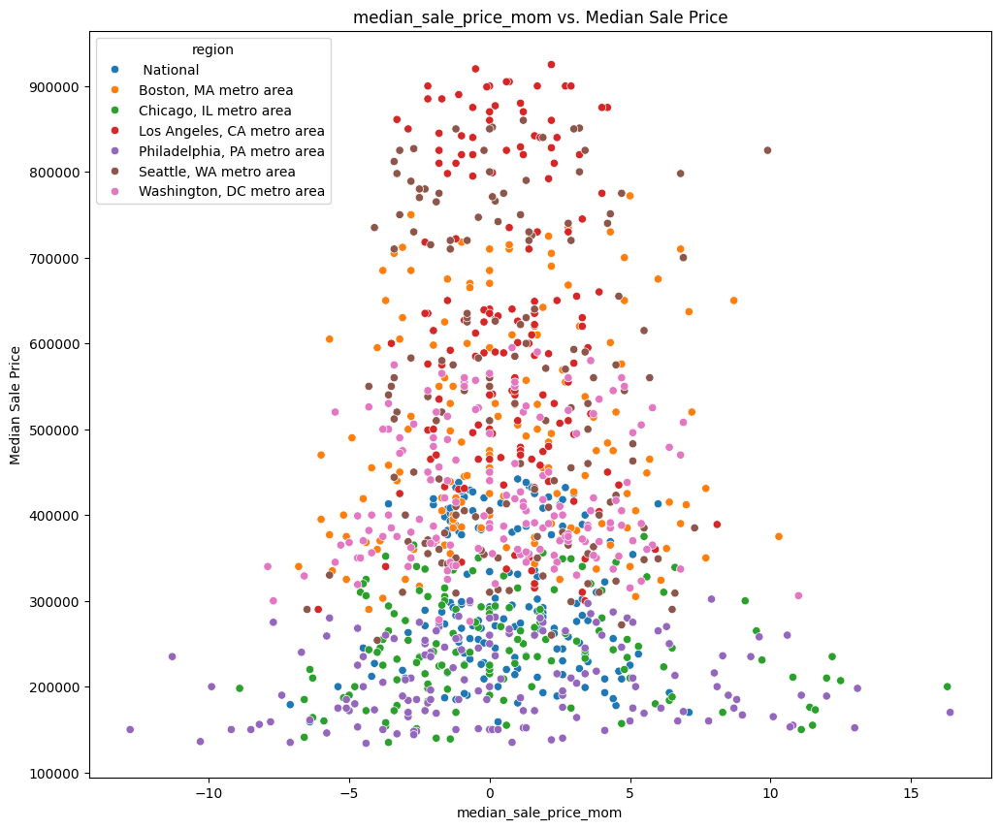

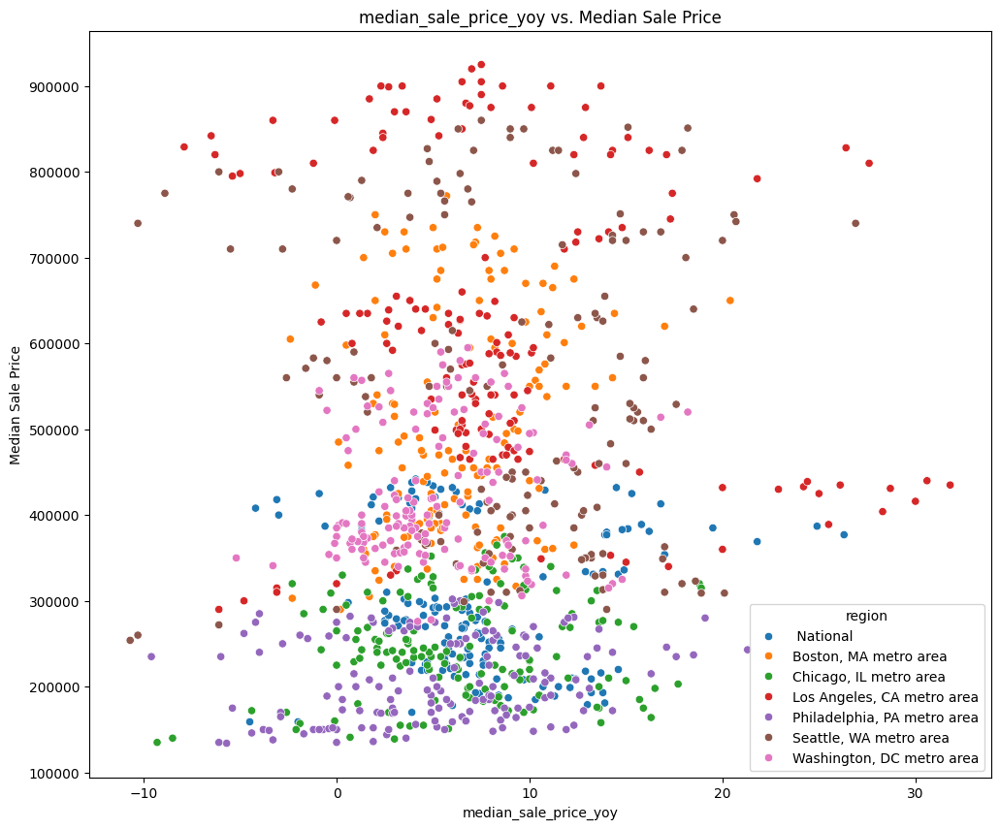

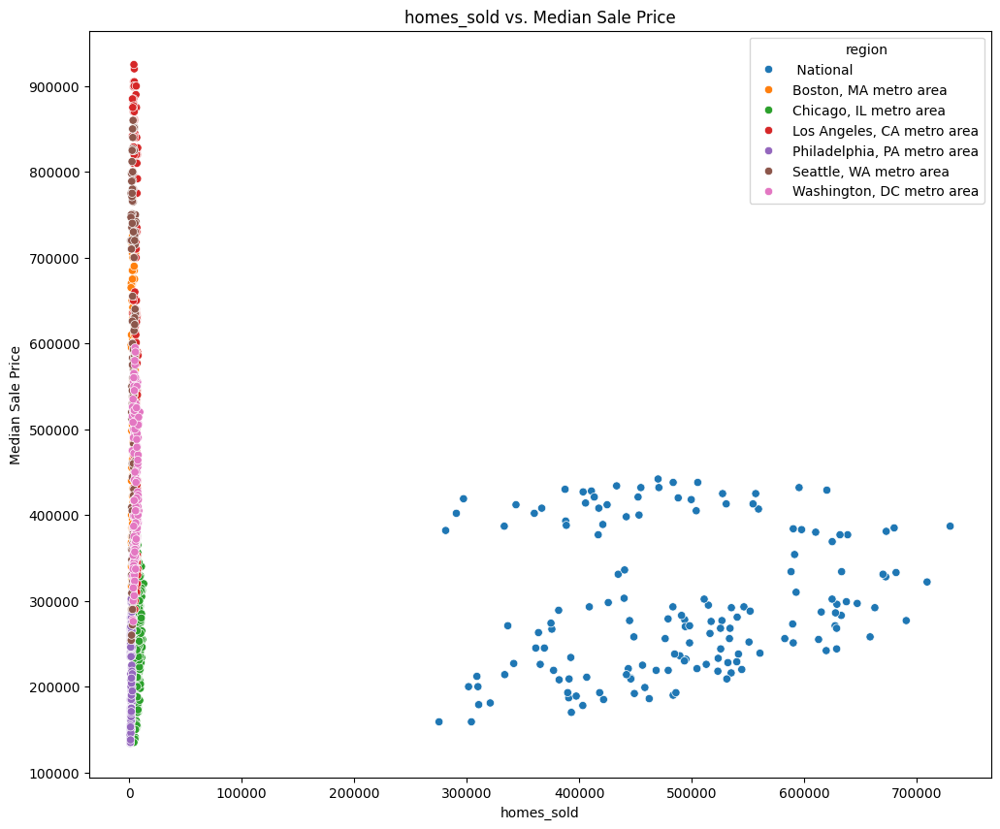

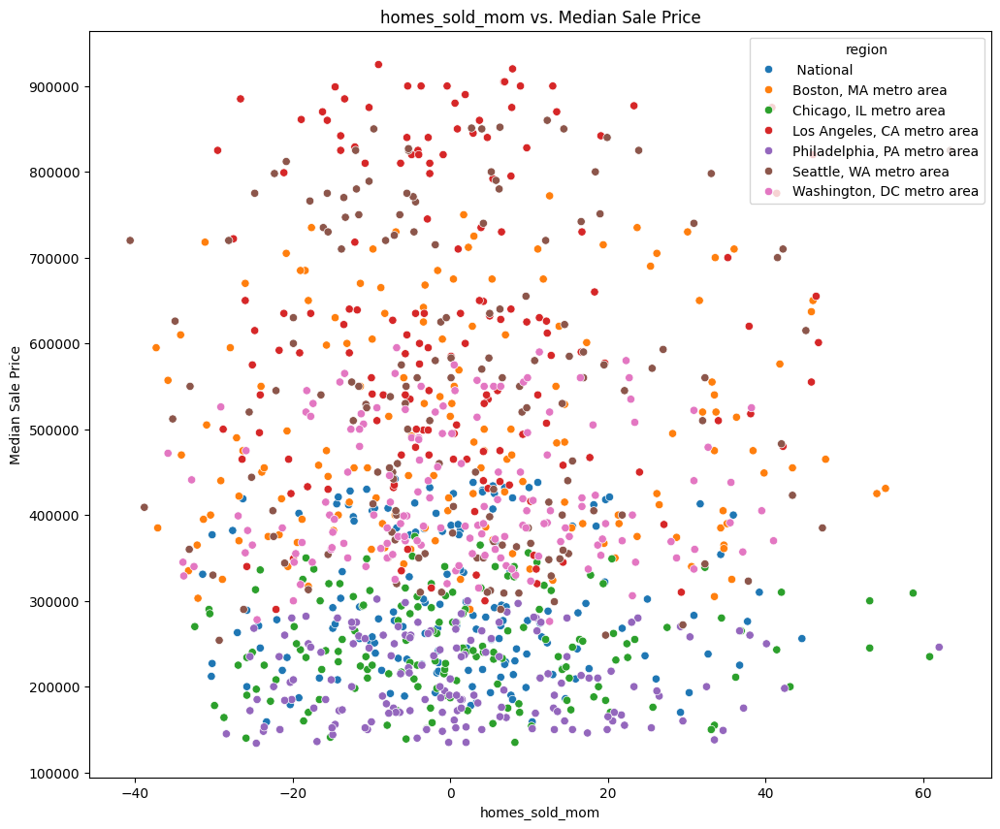

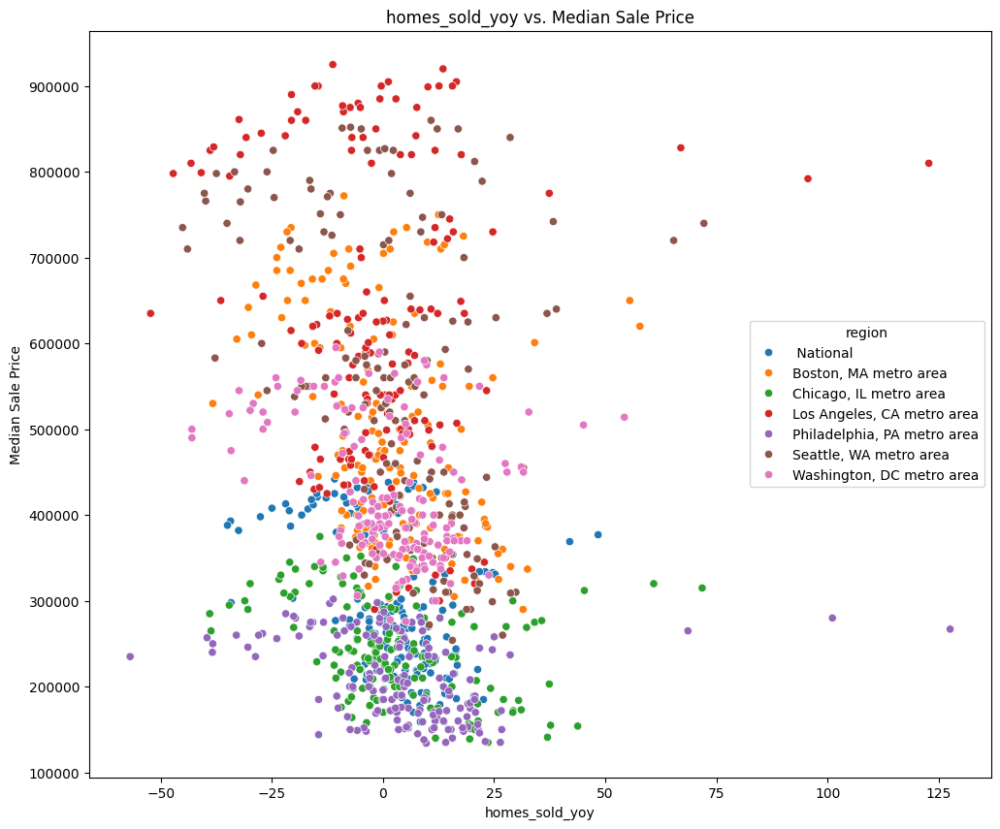

...

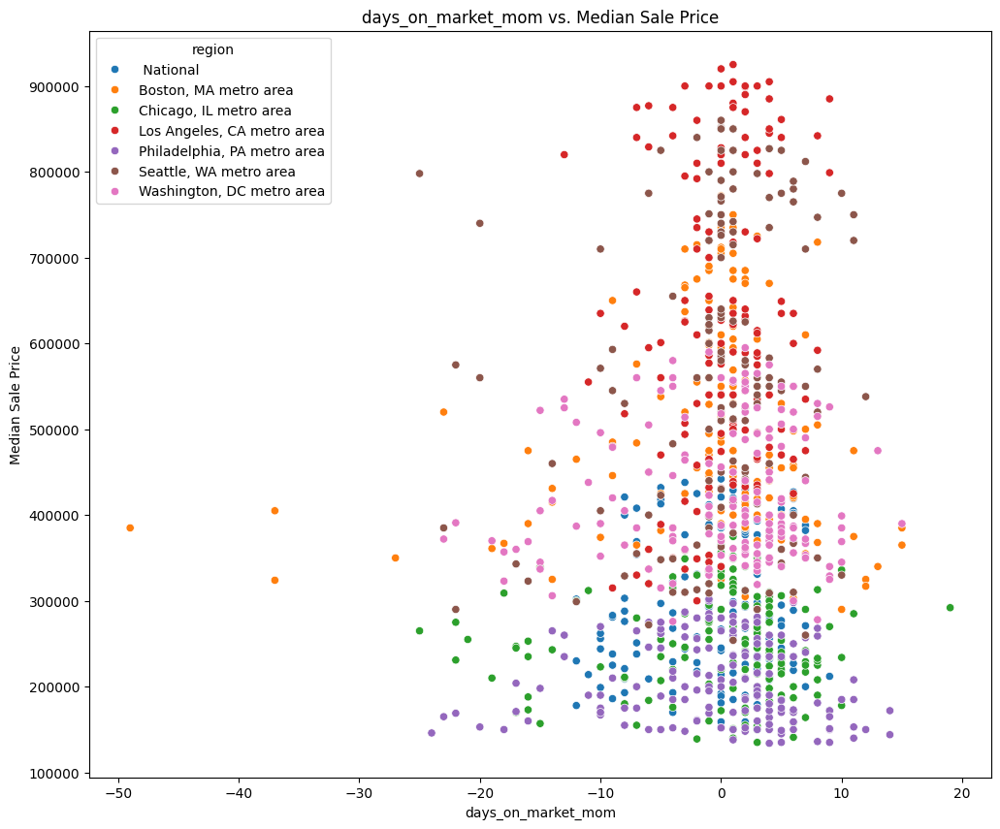

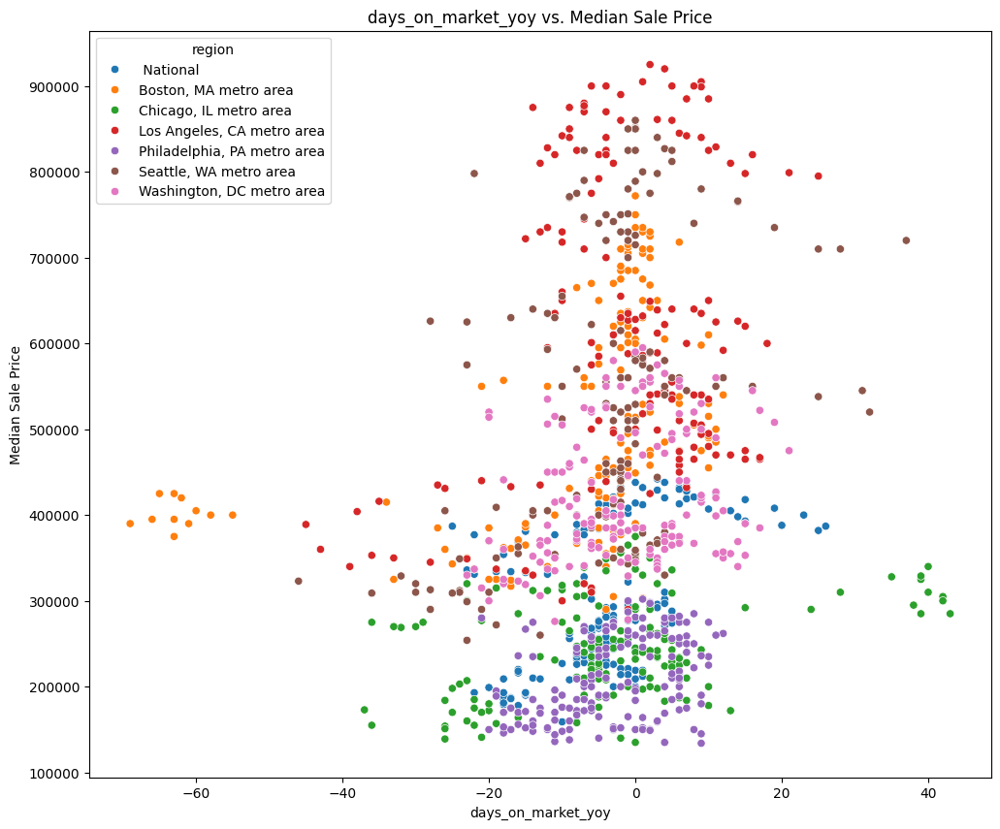

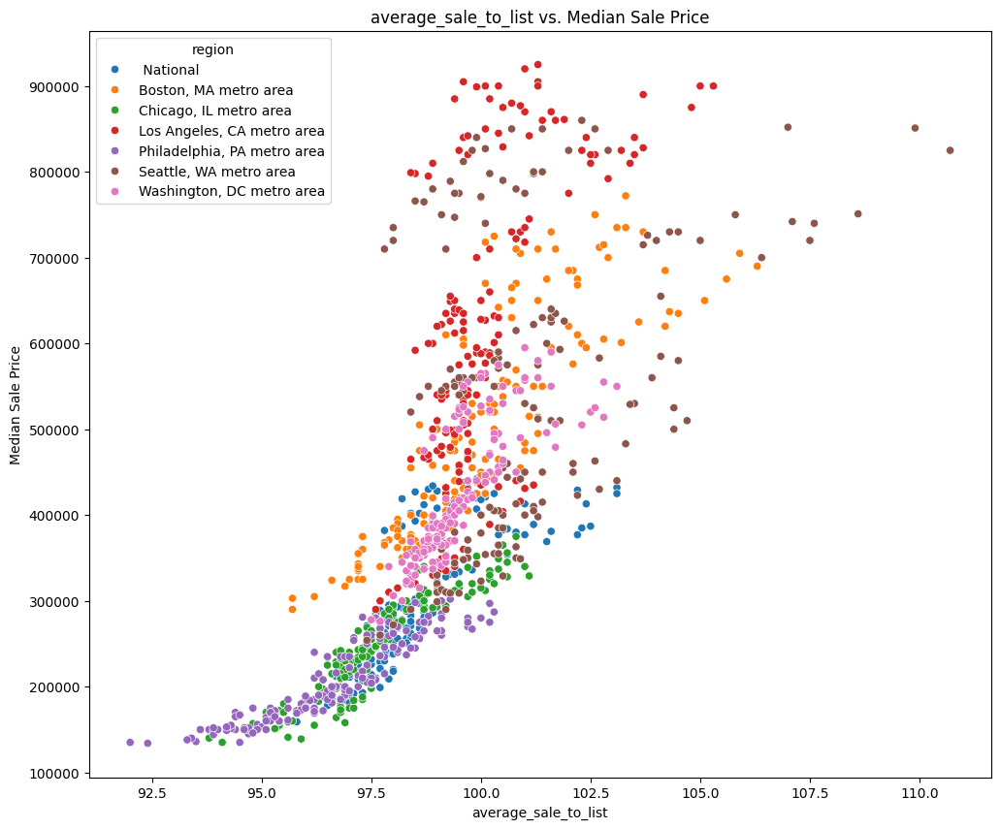

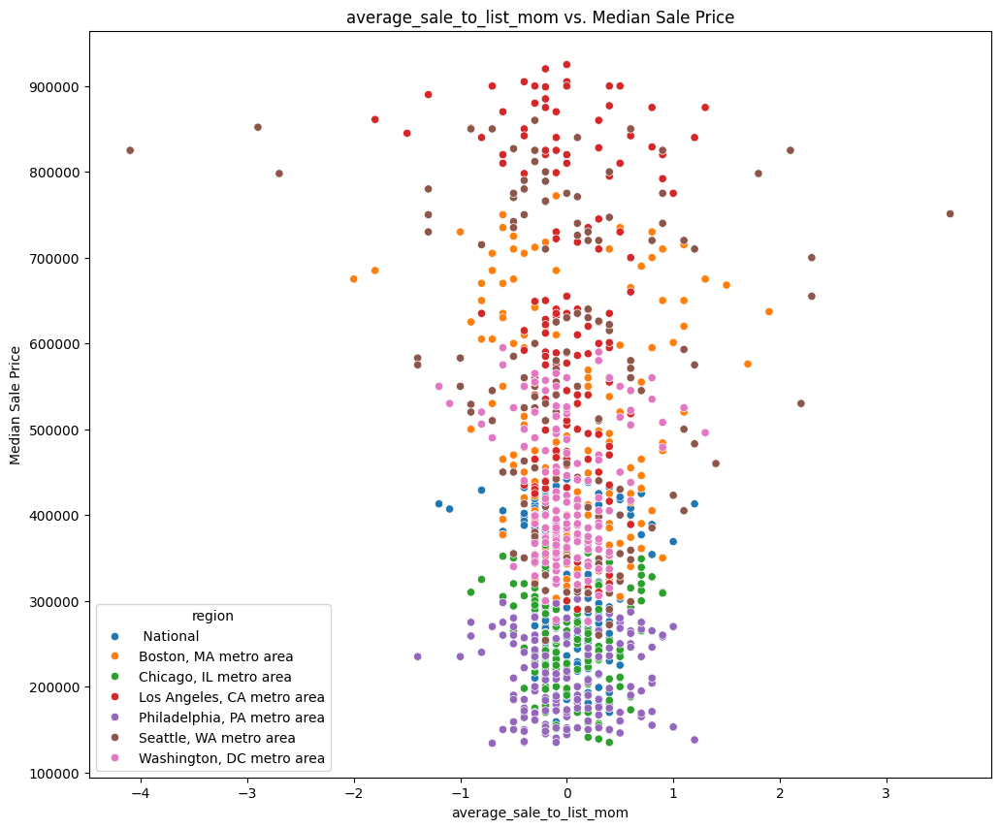

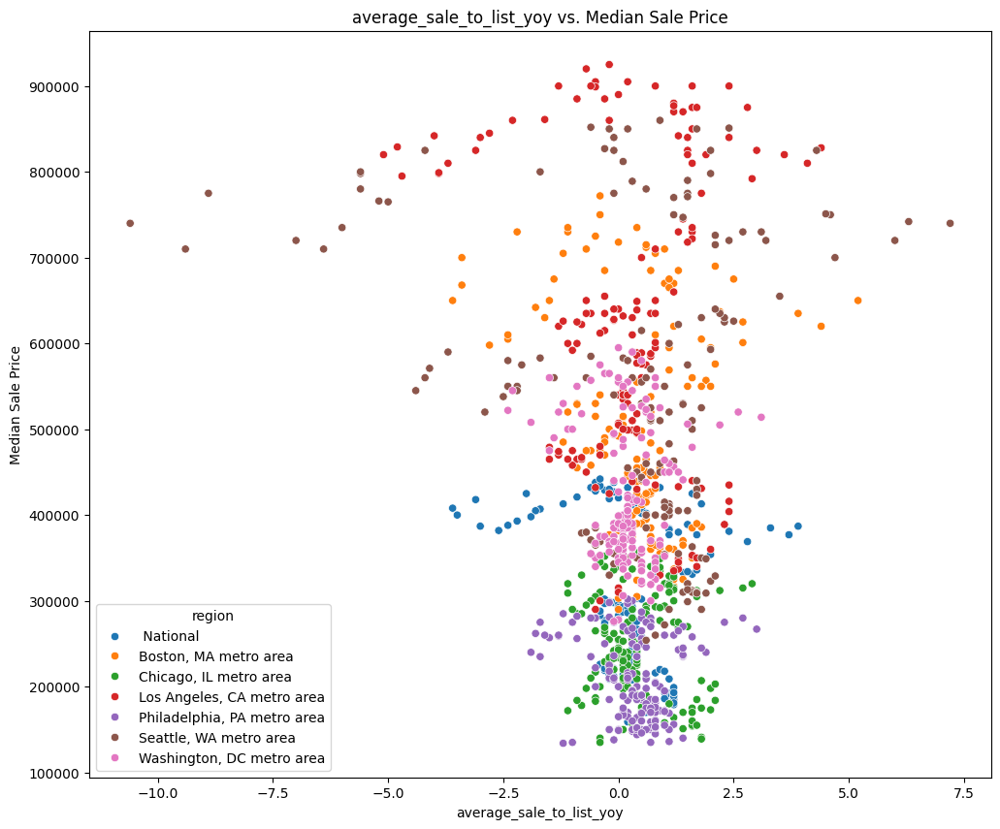

In [12]:
e.bivariate_scatterplot(redfin_df, numerical_cols, categorical_cols)

<div class="alert alert-block alert-info">
<b>ScatterPlot Insights</b>
    
Below is an interpretation of the scatterplots I’ve generated.     
    
**1. Overarching Themes & Patterns**      
1. Region-Specific Clustering
    - Boston (Orange) repeatedly stands out for higher median prices (~\\$550k–\\$600k) with short days on market (under ~25 days), suggesting a hot market with sustained demand.
    - Chicago (Green) shows moderate prices (~\\$300k–\\$400k) but occasional spikes above 60 days on market, implying seasonal or economic slowdowns.
    - Los Angeles (Red) often splits into two sub-markets: quick sales at moderate-to-high price levels and pricier listings lingering above 50 days on market, reflecting LA’s diverse property segments.
    - Seattle (Brown) experiences inventory surges that don’t immediately drag down prices—an early sign that, if demand weakens, a more noticeable price dip could follow.
2. Inventory vs. Price Lags
    - Across multiple scatterplots (especially for Seattle and the National data in Blue), we see rising inventory levels without an immediate drop in median sale prices.
    - This lag effect suggests that supply growth takes time to influence final sale prices—aligning with the idea that inventory can be an early warning measure.
3. Sales Volumes & Days on Market
    - Washington, DC (Pink) and Philadelphia (Purple) generally hover in a midrange of 20–40 days on market, with moderate price points. However, DC shows a relatively high volume of sales, indicating quick condo turnover or robust buyer interest.
    - When days on market does spike, the scatterplots show it often corresponds to slower sales volume in certain months, clarifying earlier boxplot outliers as tied to specific time frames or local conditions.
---
**2. New Insights Beyond the Boxplots**      
1. Identifying Hidden Anomalies
    - Several scatterplots reveal “micro outliers” that don’t appear extreme enough in boxplots to be flagged, but stand out when comparing two variables (e.g., extremely fast sales in a mid-price bracket for a specific region or month).
    - These subtle anomalies can signal pockets of unique activity, such as sudden investor interest or localized job growth, invisible in a univariate boxplot.
2. Leading Indicators for Market Shifts
    - In LA, DC, and Seattle especially, we see how an uptick in days on market or a surge in inventory often foreshadows a slight flattening or gradual decrease in prices a few months later.
    - This suggests a predictive dimension: if these patterns are captured in a time-series or machine learning model, they might serve as early warning signs for price shifts.
3. Region vs. National Discrepancies
    - The National (Blue) plots smooth out local spikes, confirming that aggregated data can mask volatile patterns visible only when looking at individual metros.
    - This underscores the importance of regional modeling: markets like Boston or LA behave differently than the national average, which could improve the hypothesis about analyzing local supply-demand factors.
---
**3. Tying It All to the Hypothesis**

Hypothesis Statement: Housing market trends can be predicted by analyzing historical price fluctuations, inventory changes, and sales patterns. By applying machine learning techniques, we can identify early indicators of market shifts, allowing for better-informed real estate investment decisions.

- The scatterplots confirm that:
    1. Price, inventory, and days on market each show distinct patterns by region.
    2. Lag effects (inventory changes preceding price moves) frequently appear, signifying an early signal capability.
    3. Outliers and sub-market clusters identified here reinforce the need to incorporate region-specific characteristics into any predictive model.

With these visual confirmations, the data strongly supports the hypothesis that local inventory spikes, fluctuating days on market, and changes in sales volume can foretell upcoming price adjustments. A machine learning approach integrating these features—especially broken down by metro area—stands a good chance of capturing and predicting market shifts more accurately than a one-size-fits-all national model.
</div>

---

In [13]:
redfin_df.groupby('region')['price_bin'].describe()

,count,unique,top,freq
region,,,,
National,157,3,Low,61
"Boston, MA metro area",157,3,High,71
"Chicago, IL metro area",157,3,Low,94
"Los Angeles, CA metro area",157,3,Very High,106
"Philadelphia, PA metro area",157,2,Low,119
"Seattle, WA metro area",157,4,Very High,85
"Washington, DC metro area",157,3,High,83


<div class="alert alert-block alert-info">
<b>Price_bin distribution by region Insights</b>
    
Below is overview of the price_bin distribution by region. Each region has 157 rows of data, and the table shows which bin is most frequent (“top”) as well as how many times it appears (“freq”):     
    
- Philadelphia and Chicago remain primarily “Low” price bins, suggesting generally lower median prices compared to the other metros.
- Boston and DC hover around the “High” bin most often, indicating a consistently elevated market.
- LA and Seattle both stand out with “Very High” as their predominant bin, showcasing top-tier market prices.
- National data is skewed to “Low”, which makes sense as a broad average across diverse regions—including many less expensive areas beyond major metro hubs.

Overall, these frequency counts confirm each metro’s price tier in the dataset, supporting the broader trends observed in the scatterplots and boxplots (e.g., LA’s and Seattle’s especially high prices, Philadelphia’s lower cost, etc.).
</div>

---

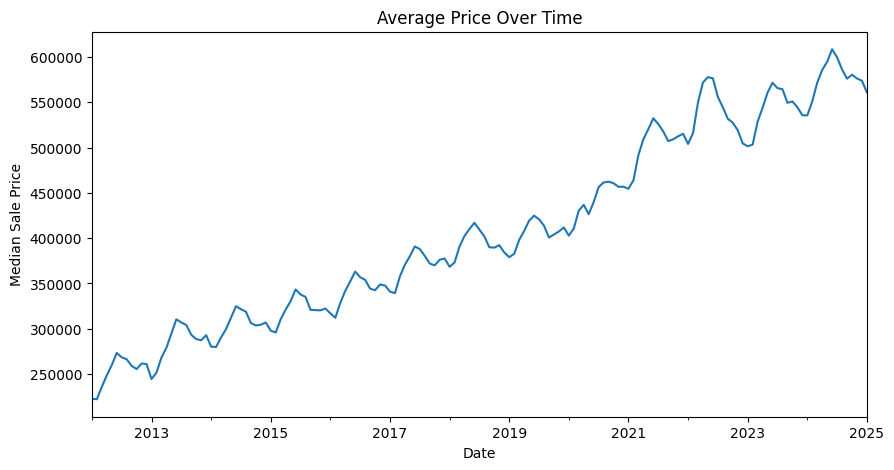

In [14]:
e.plot_average_price_over_time(redfin_df)

<div class="alert alert-block alert-info">
<b>Average Price Over Time Insights</b>
    
Below is an interpretation of the “Average Price Over Time” line chart and how it confirms or extends what we’ve seen in the other plots.
    
1. Overall Upward Trajectory      
From about \\$250k in 2012 to roughly $550k+ by late 2024, the chart depicts a steady, long-term increase in median sale prices at the national level.      
    - This upward climb aligns with the Nationwide “Low” bin we saw in price_bin distributions; although it’s labeled “Low” relative to high-cost metros like Los Angeles or Seattle, the absolute trend is still consistently rising.
    - It also matches our time-series decomposition results (and scatterplots) indicating that price dips were mostly short-lived despite fluctuations in inventory or days on market.
---
2. Mid-2019 to 2021 Acceleration
Around 2019, the slope appears to steepen briefly, followed by a small plateau in 2023–2024.
    - Some earlier scatterplots (e.g., inventory_mom vs. median_sale_price) showed that surges in inventory didn’t immediately reduce prices—this line chart confirms a continued upward price movement during that period.
    - The slight plateau in 2023–2024 could tie back to the occasional inventory spikes or days-on-market increases we saw for certain metros, suggesting a softening demand or a leveling out in the national average.
---
3. Tying Back to Region-Level Diversity       
While this chart aggregates the National data, we know from the region-based boxplots and scatterplots that individual metros like Boston or Los Angeles often exceed these values, whereas places like Chicago or Philadelphia consistently fall below.
    - The overall national upward line masks the substantial variations visible in local scatterplots. L.A. (Red) or Seattle (Brown) can be “Very High,” while Philly (Purple) is mostly “Low,” yet everyone is trending upward.
---
Final Takeaway      
This time-series line confirms a broad, long-run price appreciation, reinforcing that local anomalies (whether spikes in inventory or changes in days on market) have not derailed the national climb. It fits well with the earlier findings that supply surges sometimes lag before affecting prices and that regional differences are key, even within an overall upward trend.
</div>

---

### Week 3 EDA

Week 3:
- Tasks: 
    - Perform feature engineering.
    - Handle missing values and outliers.
- Goal: Prepare a well-structured dataset for modeling.

#### Outliers

<div class="alert alert-success">
<b>Why Are We Checking for Outliers?</b>  

The goal of this step is to **identify and handle extreme values** that could distort our analysis and model performance. Outliers can arise from **data entry errors, rare events, or genuine market fluctuations**, and it's crucial to assess their impact.  

- **Why It Matters:**  
  - Outliers can **skew statistical summaries** (e.g., mean, standard deviation).  
  - They may **negatively impact model training**, especially in regression and machine learning algorithms.  
  - Identifying them helps decide whether to **remove, transform, or cap** extreme values for better data integrity.  

By detecting outliers, we ensure that our dataset remains **accurate, reliable, and representative** of real-world trends.
</div>

In [15]:
# Checking for Outliers
outliers = e.detect_outliers_iqr(redfin_df)
print(outliers)

median_sale_price             0
median_sale_price_mom        27
median_sale_price_yoy        37
homes_sold                  157
homes_sold_mom               17
homes_sold_yoy               62
new_listings                157
new_listings_mom             79
new_listings_yoy             88
inventory                   157
inventory_mom                84
inventory_yoy                46
days_on_market               29
days_on_market_mom           80
days_on_market_yoy           75
average_sale_to_list         41
average_sale_to_list_mom     50
average_sale_to_list_yoy     97
dtype: int64


<div class="alert alert-block alert-info">
<b>Outlier Insights</b>
    
Several columns have notable outliers, particularly in:
- homes_sold (157 outliers), new_listings (157 outliers), and inventory (157 outliers): These metrics likely have extreme values in certain months or regions.
- median_sale_price_yoy (37 outliers) and homes_sold_yoy (62 outliers): High year-over-year changes indicate significant fluctuations in the market.
- days_on_market_mom (80 outliers) and days_on_market_yoy (75 outliers): The time a home stays on the market shows variability.
- average_sale_to_list_yoy (97 outliers): Changes in sale-to-list price ratios suggest market volatility.
</div>

---

In [16]:
# Selected columns with significant outliers
outlier_cols = ["homes_sold", 
                "new_listings", 
                "inventory", 
                "median_sale_price_yoy", 
                "homes_sold_yoy", 
                "days_on_market_mom", 
                "days_on_market_yoy", 
                "average_sale_to_list_yoy"]

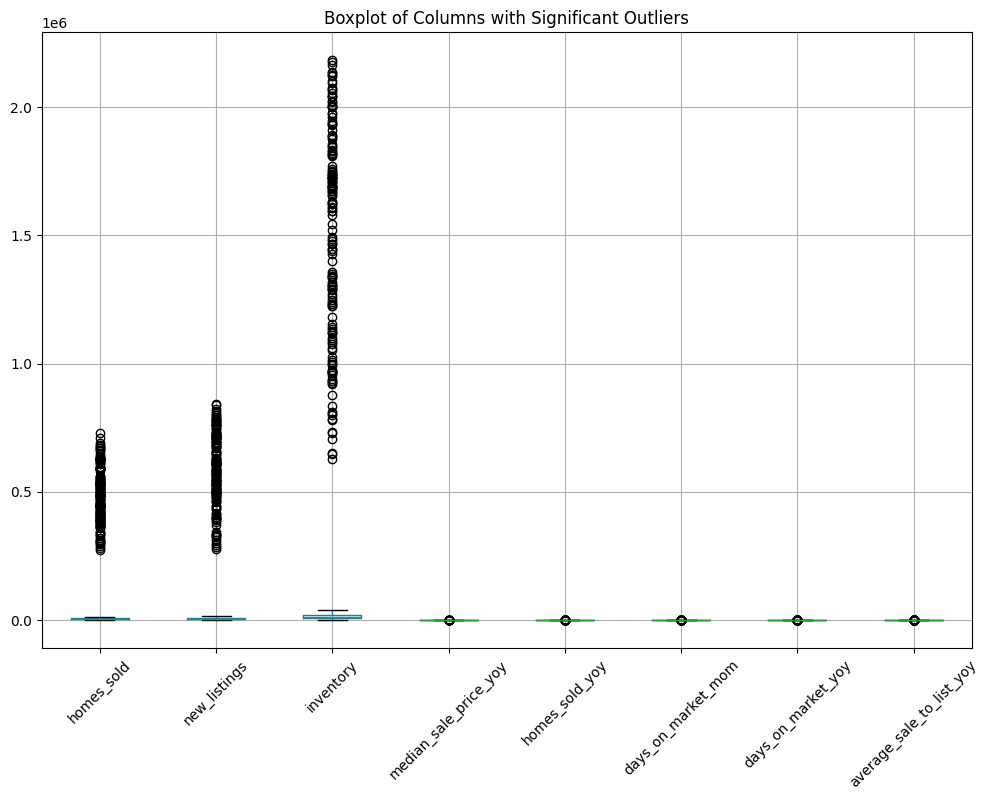

In [17]:
# Visualizing Outliers
e.visualize_outliers(redfin_df, outlier_cols)

 <div class="alert alert-block alert-info">
<b>Boxplot of Columns with Significant Outliers Insights</b>
    
The boxplot confirms the presence of extreme outliers, particularly in homes_sold, new_listings, and inventory. These could be due to market fluctuations or anomalies in reporting.
</div>

---

<div class="alert alert-success">
<b>Handling Strategies:</b>
    
1. Winsorization: Capping extreme values at the 5th and 95th percentiles to reduce impact.       
2. Log Transformation: Applying a log transformation to reduce skewness (useful if data is highly right-skewed).       
3. Outlier Removal: If values seem unrealistic or errors, we can remove them.       
    
    
I'll apply Winsorization (capping extreme values) for better distribution while preserving trends.       
</div>

---

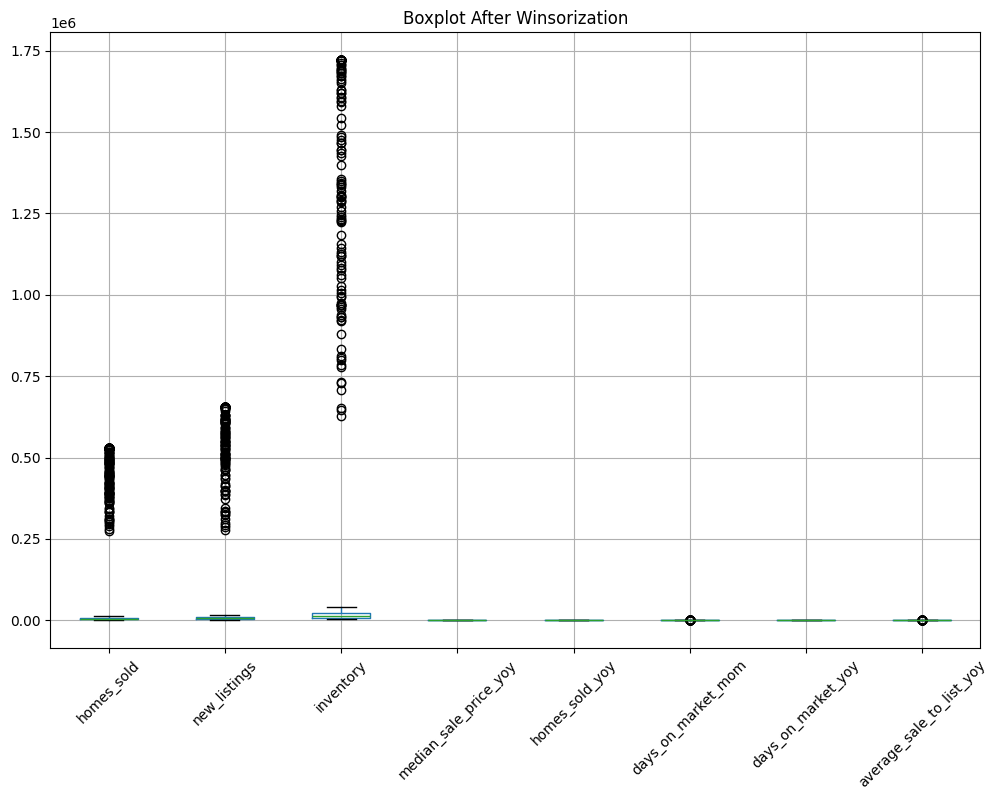

In [18]:
df_winsorized = e.apply_winsorization(redfin_df, outlier_cols)

 <div class="alert alert-block alert-info">
<b>Boxplot After Winsorization Insight</b>
    
After Winsorization, the extreme outliers have been capped, making the distribution more balanced while retaining market trends. 
</div>

---

<div class="alert alert-success">
<b>Why Are We Creating a Correlation Matrix Again?</b>  

The goal of this step is to **reassess the relationships between features after Winsorization**, ensuring that our data transformations have not significantly altered key correlations.  

- **Why It Matters:**  
  - Winsorization **caps extreme values** to reduce the impact of outliers. This can subtly shift correlations between variables.  
  - We need to confirm whether the **same strong relationships still exist** after handling outliers.  
  - If correlations remain unchanged, it validates that **Winsorization preserved overall trends** while mitigating the effects of extreme values.  
  - If correlations change significantly, we may need to revisit **feature selection** and **data transformations** to ensure model reliability.  

By computing the correlation matrix post-Winsorization, we verify that our dataset remains **structurally sound for modeling and analysis.**
</div>

In [19]:
# Drop non-numeric columns
df_winsorized_numeric = df_winsorized.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix_Winsorized = df_winsorized_numeric.corr()

In [20]:
from IPython.display import display
display(correlation_matrix_Winsorized)

,median_sale_price,median_sale_price_mom,median_sale_price_yoy,homes_sold,homes_sold_mom,homes_sold_yoy,new_listings,new_listings_mom,new_listings_yoy,inventory,inventory_mom,inventory_yoy,days_on_market,days_on_market_mom,days_on_market_yoy,average_sale_to_list,average_sale_to_list_mom,average_sale_to_list_yoy
median_sale_price,1.000000,0.005228,0.098092,-0.232658,0.001816,-0.265236,-0.237221,-0.012778,-0.076005,-0.270464,0.079763,0.171810,-0.472584,0.036927,0.236736,0.758161,-0.055247,-0.067936
median_sale_price_mom,0.005228,1.000000,0.178894,0.014147,0.653534,0.077921,0.018802,0.015628,0.053991,-0.002811,0.205451,-0.101212,-0.075931,-0.626741,-0.103519,0.111648,0.556545,0.129414
median_sale_price_yoy,0.098092,0.178894,1.000000,0.057881,0.022894,0.324370,0.052116,-0.018807,0.295929,0.020582,0.057880,-0.285196,-0.276977,-0.069687,-0.418244,0.387972,0.090790,0.610831
homes_sold,-0.232658,0.014147,0.057881,1.000000,0.014527,0.024509,0.985035,-0.041356,0.018205,0.954897,0.000578,0.000890,0.120669,-0.032259,-0.048649,-0.084859,-0.003010,-0.019541
homes_sold_mom,0.001816,0.653534,0.022894,0.014527,1.000000,0.127307,0.018705,-0.024779,0.114331,-0.004080,0.234952,-0.047563,-0.090630,-0.608613,-0.031243,0.113571,0.496990,0.052232
homes_sold_yoy,-0.265236,0.077921,0.324370,0.024509,0.127307,1.000000,0.024207,0.008135,0.587626,0.039470,-0.069369,-0.336885,0.130505,-0.079609,-0.532169,-0.161861,0.170576,0.567886
new_listings,-0.237221,0.018802,0.052116,0.985035,0.018705,0.024207,1.000000,-0.004320,0.022839,0.958168,0.032035,0.002229,0.134936,-0.052766,-0.050926,-0.090729,0.010565,-0.019728
new_listings_mom,-0.012778,0.015628,-0.018807,-0.041356,-0.024779,0.008135,-0.004320,1.000000,0.091386,-0.025606,0.482830,-0.013579,0.180043,-0.061885,0.004886,-0.035927,0.215508,0.003995
new_listings_yoy,-0.076005,0.053991,0.295929,0.018205,0.114331,0.587626,0.022839,0.091386,1.000000,0.021441,0.144859,-0.085640,-0.058362,-0.044884,-0.303271,0.026335,0.131237,0.397182
inventory,-0.270464,-0.002811,0.020582,0.954897,-0.004080,0.039470,0.958168,-0.025606,0.021441,1.000000,-0.002156,0.013893,0.207376,-0.019536,-0.054352,-0.155334,-0.012001,-0.038531


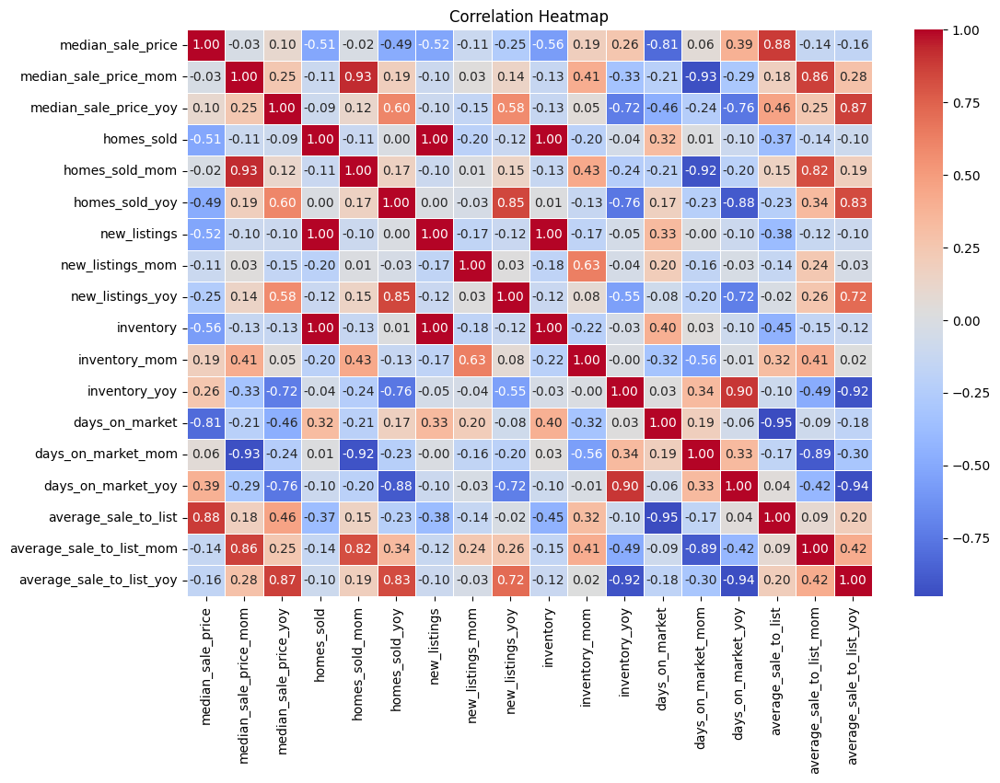

In [21]:
e.plot_correlation_heatmap(correlation_matrix_Winsorized)

 <div class="alert alert-block alert-info">
<b>Key Findings from Correlation Analysis</b>
    
Since Winsorization did not significantly impact the correlation structure, it suggests that the extreme values, while present, were not highly influential in distorting the relationships between variables. This means the dataset's original trends were robust even with the outliers.    
    
- The high correlation between homes_sold and new_listings (0.985) suggests that one of these could be dropped without significant information loss.
- inventory remains strongly correlated with homes_sold (0.955), implying potential redundancy.
- Market trends still hold:
    - Higher prices → Faster sales (Negative correlation between median_sale_price & days_on_market: -0.473).
    - Price increases reduce days on market (Negative correlation between median_sale_price_yoy & days_on_market_yoy: -0.418).
    - Sale-to-list ratio trends with median prices (0.611 correlation between average_sale_to_list_yoy & median_sale_price_yoy).

</div>

---

#### Feature Engineering

<div class="alert alert-success">
<b>Feature Engineering Discussion</b>

The goal of this step is to create meaningful features that enhance the dataset’s ability to capture market trends and improve model performance. By engineering new features, we aim to make patterns more interpretable and informative for downstream analysis.

- Market Demand Ratio (homes_sold / new_listings)
    - Helps measure market competitiveness by indicating how quickly homes are being sold relative to new listings.
    - A higher ratio suggests a strong seller's market, while a lower ratio may indicate higher inventory relative to demand.
- Days on Market Categorization (Fast, Moderate, Slow)
    - Transforms days_on_market from a raw numeric value into categories that are easier to analyze.
    - This allows us to better understand how quickly homes are selling and whether certain market conditions lead to longer selling times.         
    
By performing feature engineering at this stage, we are ensuring that the dataset is not just clean, but also structured in a way that makes it more valuable for analysis and predictive modeling. 
</div>

---

In [22]:
# Feature Engineering
df_transformed = e.create_features(df_winsorized_numeric)
df_transformed.head()

,median_sale_price,median_sale_price_mom,median_sale_price_yoy,homes_sold,homes_sold_mom,homes_sold_yoy,new_listings,new_listings_mom,new_listings_yoy,inventory,inventory_mom,inventory_yoy,days_on_market,days_on_market_mom,days_on_market_yoy,average_sale_to_list,average_sale_to_list_mom,average_sale_to_list_yoy,market_demand_ratio,days_on_market_category
0,413000,-3.6,7.4,530476,-14.4,-21.9,656191,-14.3,-11.9,1240506,10.2,27.1,21,3,6,101.0,-1.2,-1.2,0.808417,Moderate
1,407000,-1.5,6.9,530476,5.4,-16.9,622537,-11.7,-13.7,1225537,-1.2,26.7,27,5,10,99.9,-1.1,-1.7,0.852120,Moderate
2,429000,-0.7,10.8,530476,4.1,-15.0,656191,6.4,1.0,1125321,20.7,28.1,18,1,3,102.2,-0.8,-0.3,0.808417,Moderate
3,381000,-1.1,16.2,530476,-1.0,0.1,656191,-9.8,0.0,967307,-0.9,-18.2,17,2,-15,101.6,-0.6,2.1,0.808417,Moderate
4,377000,-1.0,13.9,530476,-5.1,-4.7,656191,-6.5,-4.5,969546,0.2,-16.1,19,2,-11,101.0,-0.6,1.7,0.808417,Moderate


#### Feature Selection

<div class="alert alert-success">
<b>Feature Selection and Reduction Discussion</b>

The goal here is to reduce redundancy in the dataset by removing highly correlated features while retaining the most informative ones for modeling.

- Identifying Redundant Features
From our correlation matrix:
    - homes_sold vs. new_listings (0.985 correlation)
        - Implication: Almost a direct relationship—regions with higher home sales tend to have higher new listings.
        - Decision: Drop one—likely new_listings because homes_sold directly reflects actual transactions rather than just availability.
    - inventory vs. homes_sold (0.955 correlation)
        - Implication: Inventory reflects available homes, but homes sold captures actual transactions.
        - Decision: Drop one—likely inventory since homes_sold is more action-based.

</div>

---

In [23]:
# Drop redundant features: 'new_listings' and 'inventory'
df_reduced = e.drop_redundant_features(df_transformed, ['new_listings', 'inventory','days_on_market_category'])

# Display the updated dataset after feature reduction
df_reduced.head()

,median_sale_price,median_sale_price_mom,median_sale_price_yoy,homes_sold,homes_sold_mom,homes_sold_yoy,new_listings_mom,new_listings_yoy,inventory_mom,inventory_yoy,days_on_market,days_on_market_mom,days_on_market_yoy,average_sale_to_list,average_sale_to_list_mom,average_sale_to_list_yoy,market_demand_ratio
0,413000,-3.6,7.4,530476,-14.4,-21.9,-14.3,-11.9,10.2,27.1,21,3,6,101.0,-1.2,-1.2,0.808417
1,407000,-1.5,6.9,530476,5.4,-16.9,-11.7,-13.7,-1.2,26.7,27,5,10,99.9,-1.1,-1.7,0.852120
2,429000,-0.7,10.8,530476,4.1,-15.0,6.4,1.0,20.7,28.1,18,1,3,102.2,-0.8,-0.3,0.808417
3,381000,-1.1,16.2,530476,-1.0,0.1,-9.8,0.0,-0.9,-18.2,17,2,-15,101.6,-0.6,2.1,0.808417
4,377000,-1.0,13.9,530476,-5.1,-4.7,-6.5,-4.5,0.2,-16.1,19,2,-11,101.0,-0.6,1.7,0.808417


### Week 4:
- Tasks: 
    - Select baseline models for initial testing.
    - Train and evaluate simple models.
- Goal: Identify the best initial modeling approach.

<div class="alert alert-success">
<b>Week 4 Introduction:</b>

Where We Are and Why This Matters

As we move into Week 4, our project has already gone through data collection, cleaning, and exploratory analysis (EDA). We’ve identified key trends, handled outliers, and engineered features to better understand housing market behavior.

Now, we shift our focus to modeling.

Why Are We Doing This?          
- Establishing a Baseline: Before testing complex models, we need a starting point to measure performance.         
- Understanding Patterns in the Data: By training simple models, we can assess how well our data alone predicts housing trends.         
- Guiding Future Improvements: If these models perform poorly, it signals that we need feature selection, transformations, or alternative approaches.       

What Will We Do?        
1. Split the Data → Ensuring our training, validation, and test sets are correctly structured.      
2. Calculate a Baseline Prediction → Using the mean of median_sale_price as a reference.       
3. Select and Train Baseline Models:      
    - Linear Regression (Simple benchmark for continuous predictions)       
    - Decision Tree (Captures basic non-linear relationships)      
    - Random Forest (Improves over Decision Trees with ensembling)     
    - Gradient Boosting (Strong baseline model for structured data)       
4. Evaluate Performance using:       
    - Mean Absolute Percentage Error (MAPE)      
    - Root Mean Squared Error (RMSE)      
    - R² Score      
5. Decide Next Steps: If performance is poor, explore feature engineering or alternative modeling approaches.      

---

 Expected Outcome      

 If our baseline models perform well, we refine them further.       
 If they struggle, we investigate missing variables, transformations, or alternative techniques.     

This week’s goal is not to build the best model, but to lay the foundation for informed decision-making in the next stages.      

</div>

---

In [24]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

def get_split(df, target, test_size=0.2, val_size=0.25, random_state=123):
    '''
    Splits the dataset into training, validation, and test sets.
    
    Train: 60%
    Validation: 20%
    Test: 20%
    '''
    train_validate, test = train_test_split(df, test_size=test_size, random_state=random_state)
    train, val = train_test_split(train_validate, test_size=val_size, random_state=random_state)
    
    X_train, y_train = train.drop(columns=[target]), train[target]
    X_val, y_val = val.drop(columns=[target]), val[target]
    X_test, y_test = test.drop(columns=[target]), test[target]
    
    return X_train, X_val, X_test, y_train, y_val, y_test

In [25]:
def calculate_baseline(y_train):
    """
    Computes the baseline for regression tasks using the mean of y_train.
    """
    return round(y_train.mean(), 2)  # We use the mean as a baseline predictor

In [26]:
def summarize_split(X_train, X_val, X_test, baseline_value):
    """
    Creates a summary of the dataset split and baseline (mean sale price).
    """
    split_summary = pd.DataFrame({
        "Dataset": ["Training", "Validation", "Test"],
        "Size": [X_train.shape[0], X_val.shape[0], X_test.shape[0]],
        "Feature Count": [X_train.shape[1]] * 3,
        "Baseline (Mean Sale Price)": [baseline_value] * 3
    })
    return split_summary

In [27]:
X_train, X_val, X_test, y_train, y_val, y_test = get_split(df_reduced, target='median_sale_price')

In [28]:
# Apply functions
baseline_accuracy = calculate_baseline(y_train)
baseline_accuracy

np.float64(408509.86)

In [29]:
split_summary = summarize_split(X_train, X_val, X_test, baseline_accuracy)

In [30]:
# Display dataset split summary
print(split_summary)

      Dataset  Size  Feature Count  Baseline (Mean Sale Price)
0    Training   659             16                   408509.86
1  Validation   220             16                   408509.86
2        Test   220             16                   408509.86


In [31]:
def calculate_mape(y_train):
    """
    Computes the Mean Absolute Percentage Error (MAPE) using the mean sale price.
    """
    baseline_pred = y_train.mean()  # Predicting the mean as baseline
    mape = np.mean(np.abs((y_train - baseline_pred) / y_train)) * 100  # Convert to %
    return round(mape, 2)

In [33]:
calculate_mape(y_train)

np.float64(47.4)

In [35]:
print(X_train.shape, X_test.shape)

(879, 16) (220, 16)


In [41]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder

# Ensure the dataset is properly split into features (X) and target (y)
target = 'median_sale_price'  # Define the target variable

# Identify categorical columns
categorical_cols = df_reduced.select_dtypes(include=['object']).columns

# Apply Label Encoding to categorical columns
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df_reduced[col] = le.fit_transform(df_reduced[col])  # Convert to numeric
    label_encoders[col] = le  # Store encoder for inverse transform if needed

# Define features (X) and target (y)
X = df_reduced.drop(columns=[target])  # Drop target column to get features
y = df_reduced[target]  # Target column

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define models
models = {
    "Naïve Bayes": GaussianNB(),
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree Classifier": DecisionTreeClassifier(),
    "Decision Tree Regressor": DecisionTreeRegressor(),
    "k-NN (k=5)": KNeighborsClassifier(n_neighbors=5),
    "Zero-R (Baseline)": DummyClassifier(strategy="most_frequent"),
    "Linear Regression": LinearRegression(),
    "Random Forest Regressor": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting Regressor": GradientBoostingRegressor(n_estimators=100, random_state=42)
}

# Store results
results = []

# Train and evaluate each model
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    if isinstance(model, (LinearRegression, RandomForestRegressor, GradientBoostingRegressor, DecisionTreeRegressor)):
        # Regression metrics
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        results.append({
            "Model": name,
            "MSE": mse,
            "R2 Score": r2,
            "Accuracy": None,
            "Precision": None,
            "Recall": None,
            "F1-Score": None
        })
    else:
        # Classification metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
        f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

        results.append({
            "Model": name,
            "MSE": None,
            "R2 Score": None,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1
        })

# Convert to DataFrame for display
results_df = pd.DataFrame(results)

# Display results
print(results_df)

                         Model           MSE  R2 Score  Accuracy  Precision  \
0                  Naïve Bayes           NaN       NaN  0.027273   0.019318   
1          Logistic Regression           NaN       NaN  0.004545   0.000025   
2     Decision Tree Classifier           NaN       NaN  0.013636   0.022727   
3      Decision Tree Regressor  1.142266e+10  0.611918       NaN        NaN   
4                   k-NN (k=5)           NaN       NaN  0.031818   0.021147   
5            Zero-R (Baseline)           NaN       NaN  0.004545   0.000021   
6            Linear Regression  8.889691e+09  0.697975       NaN        NaN   
7      Random Forest Regressor  3.941809e+09  0.866078       NaN        NaN   
8  Gradient Boosting Regressor  4.991659e+09  0.830410       NaN        NaN   

     Recall  F1-Score  
0  0.027273  0.021515  
1  0.004545  0.000049  
2  0.013636  0.015909  
3       NaN       NaN  
4  0.031818  0.023838  
5  0.004545  0.000041  
6       NaN       NaN  
7       NaN      